<a href="https://colab.research.google.com/github/Rekhakumari28/AI-ML-MiniProjects/blob/Cybersecurity_attacks(EDA-Analysis)/AI_ML_Week2_Cybersecurity_attacks(EDA_Analysis)_week2_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cyber Attacks by Industry Sector
 ##### Project Type - Exploratory Data Analysis (EDA) Project
 ##### Project Prepared By - Rekha Kumari Bheel
---

## Project Summary -
 This project analyzes a comprehensive cyber security dataset containing information about network traffic, attack signatures, anomaly scores, and user/device data. The dataset underwent data cleaning steps including handling missing values, fixing inconsistent categorical entries, and treating outliers in numerical variables.

### Key observations include:

* Different attack types (e.g., DDoS, SQL Injection, Malware) show distinct patterns in traffic and anomaly scores.

* Certain protocols and ports are more frequently associated with attacks.

* Severity levels and alerts/warnings highlight critical risks that require immediate action.

* Outlier detection revealed unusual traffic behaviors, which were corrected for better statistical analysis.

* The EDA provides a clear understanding of attack behaviors, high-risk network segments, and critical indicators, forming a strong foundation for developing predictive security models and intrusion detection systems in the future.
---

### GitHub Link - [Cybersecurity Attacks (EDA Analysis) - Week 2 Project](https://github.com/Rekhakumari28/AI-ML-MiniProjects/blob/main/Cybersecurity_attacks(EDA_Analysis)_week2_project.ipynb)


##  Project Objective

The objective of this project is to perform Exploratory Data Analysis (EDA) on a cyber security attack dataset to identify patterns, trends, and anomalies across different network and attack variables. By analyzing features such as protocol types, attack categories, severity levels, anomaly scores, and network details, the project aims to:

* Detect common attack types and their characteristics.
* Understand traffic distribution (normal vs malicious).

* Evaluate severity levels and their correlation with attack patterns.

* Identify anomalies and outliers in numerical attributes such as packet length, port usage, and anomaly scores.

* Provide insights that can support threat detection, incident response, and network defense strategies.
---

## Coding Section

Importing Libraries

In [ ]:
# Data manipulation
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# For missing data visualization
import missingno as msno


import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path='/content/drive/MyDrive/cybersecurity_attacks.csv'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Reading the csv file
df = pd.read_csv(path)

# copying the dataset for cleaning
df_clean = df.copy()

print(df.columns.tolist())
print(df_clean.columns.tolist())
len(df_clean.columns.tolist())

['Timestamp', 'Source IP Address', 'Destination IP Address', 'Source Port', 'Destination Port', 'Protocol', 'Packet Length', 'Packet Type', 'Traffic Type', 'Payload Data', 'Malware Indicators', 'Anomaly Scores', 'Alerts/Warnings', 'Attack Type', 'Attack Signature', 'Action Taken', 'Severity Level', 'User Information', 'Device Information', 'Network Segment', 'Geo-location Data', 'Proxy Information', 'Firewall Logs', 'IDS/IPS Alerts', 'Log Source']
['Timestamp', 'Source IP Address', 'Destination IP Address', 'Source Port', 'Destination Port', 'Protocol', 'Packet Length', 'Packet Type', 'Traffic Type', 'Payload Data', 'Malware Indicators', 'Anomaly Scores', 'Alerts/Warnings', 'Attack Type', 'Attack Signature', 'Action Taken', 'Severity Level', 'User Information', 'Device Information', 'Network Segment', 'Geo-location Data', 'Proxy Information', 'Firewall Logs', 'IDS/IPS Alerts', 'Log Source']


25

In [ ]:
# Dataset first look
print('First five row of dataset: \n')
# print(df.shape)
df_clean.head()

First five row of dataset: 



,Timestamp,Source IP Address,Destination IP Address,Source Port,Destination Port,Protocol,Packet Length,Packet Type,Traffic Type,Payload Data,...,Action Taken,Severity Level,User Information,Device Information,Network Segment,Geo-location Data,Proxy Information,Firewall Logs,IDS/IPS Alerts,Log Source
0,2023-05-30 06:33:58,103.216.15.12,84.9.164.252,31225,17616,ICMP,503,Data,HTTP,Qui natus odio asperiores nam. Optio nobis ius...,...,Logged,Low,Reyansh Dugal,Mozilla/5.0 (compatible; MSIE 8.0; Windows NT ...,Segment A,"Jamshedpur, Sikkim",150.9.97.135,Log Data,NaN,Server
1,2020-08-26 07:08:30,78.199.217.198,66.191.137.154,17245,48166,ICMP,1174,Data,HTTP,Aperiam quos modi officiis veritatis rem. Omni...,...,Blocked,Low,Sumer Rana,Mozilla/5.0 (compatible; MSIE 8.0; Windows NT ...,Segment B,"Bilaspur, Nagaland",NaN,Log Data,NaN,Firewall
2,2022-11-13 08:23:25,63.79.210.48,198.219.82.17,16811,53600,UDP,306,Control,HTTP,Perferendis sapiente vitae soluta. Hic delectu...,...,Ignored,Low,Himmat Karpe,Mozilla/5.0 (compatible; MSIE 9.0; Windows NT ...,Segment C,"Bokaro, Rajasthan",114.133.48.179,Log Data,Alert Data,Firewall
3,2023-07-02 10:38:46,163.42.196.10,101.228.192.255,20018,32534,UDP,385,Data,HTTP,Totam maxime beatae expedita explicabo porro l...,...,Blocked,Medium,Fateh Kibe,Mozilla/5.0 (Macintosh; PPC Mac OS X 10_11_5; ...,Segment B,"Jaunpur, Rajasthan",NaN,NaN,Alert Data,Firewall
4,2023-07-16 13:11:07,71.166.185.76,189.243.174.238,6131,26646,TCP,1462,Data,DNS,Odit nesciunt dolorem nisi iste iusto. Animi v...,...,Blocked,Low,Dhanush Chad,Mozilla/5.0 (compatible; MSIE 5.0; Windows NT ...,Segment C,"Anantapur, Tripura",149.6.110.119,NaN,Alert Data,Firewall


In [ ]:
num_row, num_cols = df_clean.shape
print(f'Number of rows: {num_row}')
print(f'Number of columns: {num_cols}')

Number of rows: 40000
Number of columns: 25


Dataset Information

In [ ]:
# Dataset Info
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Timestamp               40000 non-null  object 
 1   Source IP Address       40000 non-null  object 
 2   Destination IP Address  40000 non-null  object 
 3   Source Port             40000 non-null  int64  
 4   Destination Port        40000 non-null  int64  
 5   Protocol                40000 non-null  object 
 6   Packet Length           40000 non-null  int64  
 7   Packet Type             40000 non-null  object 
 8   Traffic Type            40000 non-null  object 
 9   Payload Data            40000 non-null  object 
 10  Malware Indicators      20000 non-null  object 
 11  Anomaly Scores          40000 non-null  float64
 12  Alerts/Warnings         19933 non-null  object 
 13  Attack Type             40000 non-null  object 
 14  Attack Signature        40000 non-null

Duplicate Values

In [ ]:
# Dataset duplicate value count
df_clean.duplicated().sum()

np.int64(0)

Missing Values / Null Values

In [ ]:
#Missing Values/Null Values Count
df_clean.isnull().sum()

,0
Timestamp,0
Source IP Address,0
Destination IP Address,0
Source Port,0
Destination Port,0
Protocol,0
Packet Length,0
Packet Type,0
Traffic Type,0
Payload Data,0


## Visualizing the missing values

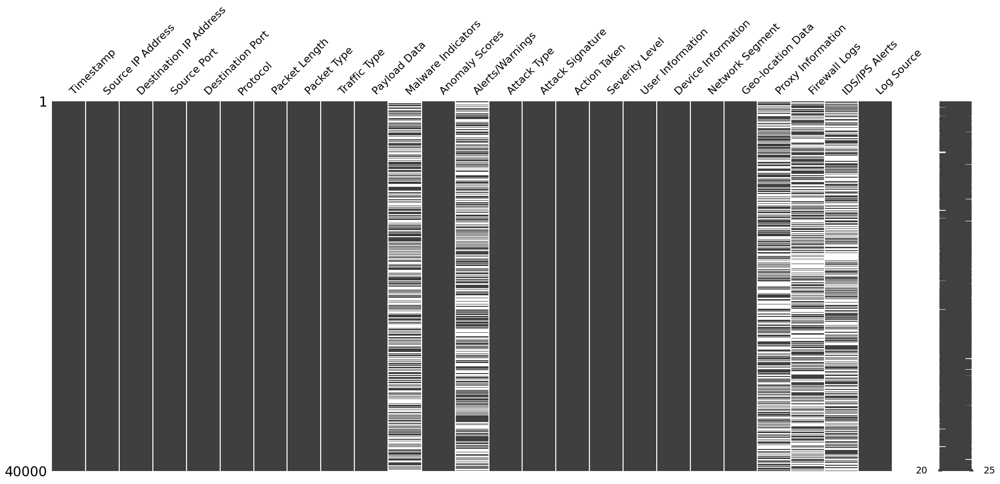

In [ ]:
# Visualizing the missing values
# Missingno Matrix
msno.matrix(df_clean)
plt.show()


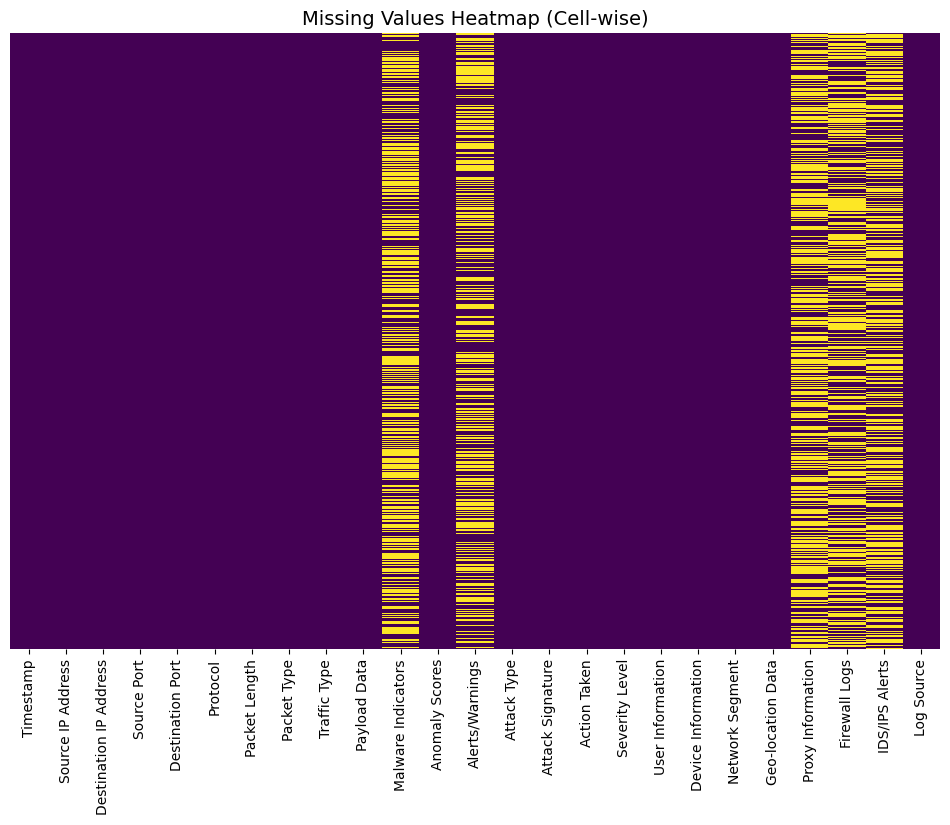

In [ ]:
# Heatmap visualization of missing data correlation
plt.figure(figsize=(12,8))
sns.heatmap(df.isnull(),
            cbar=False,
            cmap='viridis',
            yticklabels=False,   # 🚀 hides row labels (prevents freeze)
            xticklabels=df.columns)
plt.title("Missing Values Heatmap (Cell-wise)", fontsize=14)
plt.show()

## Know About Dataset

### 2.Understanding Our Variables

In [ ]:
# Dataset Columns
print('Columns Present in the dataset')
print(df_clean.columns)

print('\n Data types of the columns of the dataset: ')
print(df_clean.dtypes)

Columns Present in the dataset
Index(['Timestamp', 'Source IP Address', 'Destination IP Address',
       'Source Port', 'Destination Port', 'Protocol', 'Packet Length',
       'Packet Type', 'Traffic Type', 'Payload Data', 'Malware Indicators',
       'Anomaly Scores', 'Alerts/Warnings', 'Attack Type', 'Attack Signature',
       'Action Taken', 'Severity Level', 'User Information',
       'Device Information', 'Network Segment', 'Geo-location Data',
       'Proxy Information', 'Firewall Logs', 'IDS/IPS Alerts', 'Log Source'],
      dtype='object')

 Data types of the columns of the dataset: 
Timestamp                  object
Source IP Address          object
Destination IP Address     object
Source Port                 int64
Destination Port            int64
Protocol                   object
Packet Length               int64
Packet Type                object
Traffic Type               object
Payload Data               object
Malware Indicators         object
Anomaly Scores            f

## Dataset Describe

In [ ]:
print('Description of the Dataset: ')
df_clean.describe()

Description of the Dataset: 


,Source Port,Destination Port,Packet Length,Anomaly Scores
count,40000.000000,40000.000000,40000.000000,40000.000000
mean,32970.356450,33150.868650,781.452725,50.113473
std,18560.425604,18574.668842,416.044192,28.853598
min,1027.000000,1024.000000,64.000000,0.000000
25%,16850.750000,17094.750000,420.000000,25.150000
50%,32856.000000,33004.500000,782.000000,50.345000
75%,48928.250000,49287.000000,1143.000000,75.030000
max,65530.000000,65535.000000,1500.000000,100.000000


## Variable Description

In [ ]:
print('Unique value in each columns of the Dataset: \n ')
print(df_clean.nunique())

Unique value in each columns of the Dataset: 
 
Timestamp                 39997
Source IP Address         40000
Destination IP Address    40000
Source Port               29761
Destination Port          29895
Protocol                      3
Packet Length              1437
Packet Type                   2
Traffic Type                  3
Payload Data              40000
Malware Indicators            1
Anomaly Scores             9826
Alerts/Warnings               1
Attack Type                   3
Attack Signature              2
Action Taken                  3
Severity Level                3
User Information          32389
Device Information        32104
Network Segment               3
Geo-location Data          8723
Proxy Information         20148
Firewall Logs                 1
IDS/IPS Alerts                1
Log Source                    2
dtype: int64


## Data Wrangling

Remove exact duplicates

In [ ]:
print('Checking for duplicate rows...\n')
print('Duplicates found: ', df_clean.duplicated().sum())

df_clean = df_clean.drop_duplicates()
print('Shape after removing duplicates: ', df_clean.shape)


Checking for duplicate rows...

Duplicates found:  0
Shape after removing duplicates:  (40000, 25)


Fix inconsistent entries

In [ ]:
# Standardize text values in Attack Type
print('1. Fix inconsistent capitalization in Attack Type')
df['Attack Type'] = df['Attack Type'].str.strip().str.title()

print('2. Fix inconsistencies in Severity Level')
df['Severity Level'] = df['Severity Level'].replace({
    'critical':'Critical',
    'CRIT':'Critical',
    'high':'High',
    'med':'Medium',
    'low':'Low'
})

print('3. Fix inconsistencies in Protocol')
df['Protocol'] = df['Protocol'].str.upper()

print('4. Fix inconsistencies in Traffic Type')
df['Traffic Type'] = df['Traffic Type'].str.strip().str.title()

1. Fix inconsistent capitalization in Attack Type
2. Fix inconsistencies in Severity Level
3. Fix inconsistencies in Protocol
4. Fix inconsistencies in Traffic Type


Handle missing values

In [ ]:
print("Handling missing values...\n")

# Numerical columns → median
num_cols = ["src_port", "dst_port", "packet_length", "anomaly_scores"]
for col in num_cols:
    if col in df.columns:
        df[col] = df[col].fillna(df[col].median())

# Categorical columns → mode
cat_cols = ["protocol", "attack_type", "severity_level", "traffic_type", "action_taken"]
for col in cat_cols:
    if col in df.columns:
        df[col] = df[col].fillna(df[col].mode()[0])

print("Missing values left:", df.isnull().sum().sum())


Handling missing values...

Missing values left: 99929


Detect & treat outliers

In [ ]:
print("Detecting and treating outliers...\n")

numeric_cols = df_clean.select_dtypes(include=[np.number]).columns.tolist()
for col in numeric_cols:
    Q1 = df_clean[col].quantile(0.25)
    Q3 = df_clean[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    median_val = df_clean[col].median()
    df_clean.loc[df_clean[col] < lower, col] = median_val
    df_clean.loc[df_clean[col] > upper, col] = median_val


Detecting and treating outliers...



Scaling & normalization

In [ ]:
# 5. Scaling & normalization
print("Scaling numerical features...\n")

numeric_cols = ["Source Port", "Destination Port", "Packet Length", "Anomaly Scores"]
scale_cols = [col for col in numeric_cols if col in df.columns]  # check they exist

scaler = MinMaxScaler()
df[scale_cols] = scaler.fit_transform(df[scale_cols])

print("Scaling completed for:", scale_cols)


Scaling numerical features...

Scaling completed for: ['Source Port', 'Destination Port', 'Packet Length', 'Anomaly Scores']


Encoding categorical data

In [ ]:
# 6. Encoding categorical data
print("Encoding categorical features...\n")

# List of categorical columns you want
categorical_cols = [
    'Protocol', 'Packet Type', 'Traffic Type', 'Attack Type',
    'Action Taken', 'Severity Level', 'Network Segment',
    'Geo-location Data', 'Proxy Information', 'Log Source'
]

# Keep only those that actually exist in df_clean
categorical_cols = [col for col in categorical_cols if col in df_clean.columns]

# Encode safely
df_clean = pd.get_dummies(df_clean, columns=categorical_cols, drop_first=True)

print("Encoding completed!")


Encoding categorical features...

Encoding completed!


Feature Engineering

In [ ]:
print("Feature Engineering...\n")

# 1. Binary target column (Attack Flag)
if "Attack Type" in df_clean.columns:
    df_clean["attack_flag"] = df_clean["Attack Type"].df_clean["attack_flag"] = df_clean["Attack Type"].astype(int)

# 2. Severity Level → Ordinal Encoding
if "Severity Level" in df_clean.columns:
    severity_map = {"low": 1, "medium": 2, "high": 3, "critical": 4}
    df_clean["severity_level_encoded"] = (
        df_clean["Severity Level"].str.lower().map(severity_map)
    )

# 3. Packet Size Group (binning)
if "Packet Length" in df_clean.columns:
    df_clean["packet_size_group"] = pd.cut(
        df_clean["Packet Length"],
        bins=[0, 500, 1500, df_clean["Packet Length"].max()],
        labels=["Small", "Medium", "Large"]
    )
    df_clean = pd.get_dummies(df_clean, columns=["packet_size_group"], drop_first=True)

# 4. Anomaly per Packet ratio
if "Anomaly Scores" in df_clean.columns and "Packet Length" in df_clean.columns:
    df_clean["anom_per_packet"] = df_clean["Anomaly Scores"] / (df_clean["Packet Length"] + 1)

print("New features added successfully!")


Feature Engineering...

New features added successfully!


Drop unnecessary columns

In [ ]:
df_clean = df_clean.drop(columns=[
    "Timestamp",
    "Source IP Address",
    "Destination IP Address",
    "Payload Data",
    "User Information",
    "Device Information",
    # "Geo-location Data", # commented out to keep for scatter plot
    "Proxy Information",
    "Firewall Logs",
    "IDS/IPS Alerts",
    "Log Source"
], errors="ignore")

Final Processed Dataset

In [ ]:
print('Final dataset shape: ', df_clean.shape)
df_clean.head()

Final dataset shape:  (40000, 28890)


,Source Port,Destination Port,Packet Length,Malware Indicators,Anomaly Scores,Alerts/Warnings,Attack Signature,Protocol_TCP,Protocol_UDP,Packet Type_Data,...,Proxy Information_99.78.230.212,Proxy Information_99.80.23.171,Proxy Information_99.81.30.63,Proxy Information_99.87.150.1,Proxy Information_99.89.108.231,Proxy Information_99.89.194.35,Proxy Information_99.92.150.46,Proxy Information_99.92.154.17,Proxy Information_99.97.192.156,Log Source_Server
0,31225,17616.0,503,IoC Detected,28.67,NaN,Known Pattern B,False,False,True,...,False,False,False,False,False,False,False,False,False,True
1,17245,48166.0,1174,IoC Detected,51.50,NaN,Known Pattern A,False,False,True,...,False,False,False,False,False,False,False,False,False,False
2,16811,53600.0,306,IoC Detected,87.42,Alert Triggered,Known Pattern B,False,True,False,...,False,False,False,False,False,False,False,False,False,False
3,20018,32534.0,385,NaN,15.79,Alert Triggered,Known Pattern B,False,True,True,...,False,False,False,False,False,False,False,False,False,False
4,6131,26646.0,1462,NaN,0.52,Alert Triggered,Known Pattern B,True,False,True,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
df_clean.columns = df_clean.columns.str.strip().str.replace(" ", "_").str.lower()
print(df_clean.columns.tolist())

print('\nTarget distribution:')
# df_clean['attack_type_intrusion'].value_counts()

['timestamp', 'source_ip_address', 'destination_ip_address', 'source_port', 'destination_port', 'protocol', 'packet_length', 'packet_type', 'traffic_type', 'payload_data', 'malware_indicators', 'anomaly_scores', 'alerts/warnings', 'attack_type', 'attack_signature', 'action_taken', 'severity_level', 'user_information', 'device_information', 'network_segment', 'geo-location_data', 'proxy_information', 'firewall_logs', 'ids/ips_alerts', 'log_source']

Target distribution:


## Geo-location Data vs Anomaly Scores for Top 4 Attack Types

In [ ]:
import plotly.express as px
from sklearn.preprocessing import LabelEncoder

# Encode Geo-location Data into numeric codes
encoder = LabelEncoder()
df['Geo_location_code'] = encoder.fit_transform(df['Geo-location Data'].astype(str))

# Top 4 attack types
top_attacks = df['Attack Type'].value_counts().nlargest(4)
top_list = top_attacks.index.tolist()

print("Top 4 Attack Types:")
display(top_attacks)

# Filter only top attacks
df_top = df[df['Attack Type'].isin(top_list)]

# Responsive scatter plot
fig = px.scatter(
    df_top,
    x="Geo_location_code",
    y="Anomaly Scores",
    color="Attack Type",
    hover_data=["Geo-location Data"],   # show real names on hover
    title="Geo-location Data vs Anomaly Scores for Top 4 Attack Types"
)

# Improve layout for responsiveness
fig.update_layout(
    xaxis_title="Geo-location Data (encoded)",
    yaxis_title="Anomaly Scores",
    legend_title="Attack Type",
    template="plotly_white",
    autosize=True
)

fig.show()

# Mapping back encoded numbers to original names (still useful)
geo_mapping = dict(zip(df['Geo_location_code'], df['Geo-location Data']))


Top 4 Attack Types:


,count
Attack Type,
DDoS,13428
Malware,13307
Intrusion,13265


## Box Plot (5-Number Summary) of Packet Length

In [ ]:
import plotly.express as px
from plotly.offline import iplot

# Box plot for Packet Length
fig = px.box(
    df_clean,
    y="Packet Length",
    labels={"Packet Length": "Packet Length"},
    title="5-Number-Summary (Box Plot) of Packet Length"
)

iplot(fig)


## Bubble Scatter Plot: Packet Length vs Anomaly Scores (by Attack Type)

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplot: 1 row, 2 columns (main plot + mini summary)
fig = make_subplots(
    rows=1, cols=2,
    column_widths=[0.7, 0.3],
    specs=[[{"type": "scatter"}, {"type": "bar"}]],
    subplot_titles=("Packet Length vs Anomaly Scores", "Attack Type Summary")
)

# Main bubble scatter plot
fig.add_trace(
    go.Scatter(
        x=df_clean["Packet Length"],
        y=df_clean["Anomaly Scores"],
        mode="markers",
        marker=dict(size=10, color=df_clean["Attack Type"].astype('category').cat.codes, showscale=False),
        text=df_clean["Source IP Address"] + "<br>Malware: " + df_clean["Malware Indicators"].astype(str)
    ),
    row=1, col=1
)

# Mini summary bar chart: counts per Attack Type
attack_counts = df_clean["Attack Type"].value_counts()
fig.add_trace(
    go.Bar(
        x=attack_counts.index,
        y=attack_counts.values,
        text=attack_counts.values,
        textposition='auto'
    ),
    row=1, col=2
)

# Layout
fig.update_layout(width=1200, height=600, title_text="Cybersecurity Attack Analysis Dashboard")
fig.show()


## Scatter Plot: Packet Length vs Source IP Address
 Colored by Top 4 Attack Types

In [ ]:
import plotly.express as px

# Pick Top 4 Attack Types for clarity
top_attacks = df_clean["Attack Type"].value_counts().nlargest(4).index
df_top = df_clean[df_clean["Attack Type"].isin(top_attacks)]

# Interactive scatter plot
fig = px.scatter(
    df_top,
    x="Packet Length",
    y="Source IP Address",
    color="Traffic Type",
    title="Scatter Plot of Anomaly Scores vs Packet Length (colored by Attack Type)"
)

# Make it responsive
fig.update_layout(
    autosize=True,
    width=1400,
    height=600,
    legend_title="Attack Type"
)

fig.show()


## Scatter Plot of Packet Length vs Anomaly Scores (faceted by Attack Type)

In [ ]:
import plotly.express as px

# Facet scatter plot by Attack Type
fig = px.scatter(
    df_clean,
    x="Packet Length",
    y="Anomaly Scores",
    color="Attack Type",
    facet_col="Attack Type",           # split by attack type
    size_max=15,
    hover_name="Source IP Address",
    hover_data=["Malware Indicators"],
    title="Scatter Plot of Packet Length vs Anomaly Scores (faceted by Attack Type)"
)

# Fixed bubble size (to avoid TypeError with strings)
fig.update_traces(marker=dict(size=10))

# Responsive layout
fig.update_layout(width=1200, height=500)
fig.show()


## Anomaly Scores by Packet Length and Attack Type

In [ ]:
import plotly.express as px

fig = px.bar(
    df,
    x='Packet Length',
    y="Anomaly Scores",
    hover_data=['Source IP Address'],
    color='Attack Type',
    height=500,
    color_discrete_sequence=px.colors.qualitative.Bold  # darker, clearer colors
)

# Add chart title and axis labels
fig.update_layout(
    title="Anomaly Scores by Packet Length and Attack Type",
    xaxis_title="Packet Length",
    yaxis_title="Anomaly Scores",
    title_font=dict(size=20, color='black', family="Arial"),
    legend_title="Attack Type"
)

fig.show()


## Attack Type vs Severity Level

In [ ]:
import plotly.express as px

# Group by Attack Type and Severity Level
rating_df = df.groupby(['Attack Type', 'Severity Level']).size().reset_index(name='counts')

# Create bar chart
fig = px.bar(rating_df, x='Attack Type', y='counts', color='Severity Level')

fig.update_traces(textposition='auto', textfont_size=20)
fig.update_layout(barmode='stack')

fig.show()


## Attack Types by Severity Level
Bar chart with clear colors + heading

In [ ]:
import pandas as pd
import plotly.express as px

# Group by Attack Type and Severity Level
rating_df = df.groupby(['Attack Type', 'Severity Level']).size().reset_index(name='counts')
rating_df['counts'] = pd.to_numeric(rating_df['counts'], errors='coerce').fillna(0)

# Bar chart with clear colors + heading
fig = px.bar(
    rating_df,
    x='Attack Type',
    y='counts',
    color='Severity Level',
    text='counts',
    color_discrete_sequence=px.colors.qualitative.Bold,
    height=520
)

fig.update_traces(textposition='outside', cliponaxis=False, textfont_size=14)
fig.update_layout(
    barmode='stack',
    title_font=dict(size=24, family="Arial"),
    xaxis_title="Attack Type",
    yaxis_title="Count",
    legend_title="Severity Level",
    xaxis_tickangle=-30,
    template="plotly_white"
)

fig.show()


## Attack Types by Severity Level

In [ ]:
import plotly.express as px

# Group by Attack Type and Severity Level
rating_df = df.groupby(['Attack Type', 'Severity Level']).size().reset_index(name='counts')

# Create grouped bar chart
fig = px.bar(
    rating_df,
    x='Attack Type',
    y='counts',
    color='Severity Level',
    text='counts',
    color_discrete_sequence=px.colors.qualitative.Bold,
    height=520
)

# Style
fig.update_traces(textposition='outside', cliponaxis=False, textfont_size=14)
fig.update_layout(
    barmode='group',

    title_font=dict(size=22, family="Arial"),
    xaxis_title="Attack Type",
    yaxis_title="Counts",
    legend_title="Severity Level",
    xaxis_tickangle=-30,
    template="plotly_white"
)


## Packet Length vs Anomaly Scores

In [ ]:
import plotly.express as px

fig = px.scatter(
    df,
    x="Packet Length",         # numeric column for X
    y="Anomaly Scores",        # numeric column for Y
    color="Attack Type",       # categorical column for color
    marginal_x="histogram",    # histogram above
    marginal_y="box",          # boxplot on right
    color_discrete_sequence=px.colors.qualitative.Set2,
    title="Packet Length vs Anomaly Scores"
)

fig.update_layout(
    title_font=dict(size=22, family="Arial"),
    xaxis_title="Packet Length",
    yaxis_title="Anomaly Scores",
    legend_title="Attack Type",
    height=600
)

fig.show()


## Distribution of Severity Level by Attack Type

In [ ]:
import plotly.express as px

# Group data by Attack Type and Severity Level
grouped_df = df.groupby(['Attack Type', 'Severity Level']).size().reset_index(name='counts')

# Create faceted pie charts
fig = px.pie(
    grouped_df,
    names="Severity Level",
    values="counts",
    facet_col="Attack Type",  # one pie per Attack Type
    color="Severity Level"
)

# Update layout
fig.update_traces(textposition="inside", textinfo="percent+label")
fig.update_layout(title_text="Distribution of Severity Level by Attack Type")

fig.show()


## Frequency of Attack Types

In [ ]:
import pandas as pd
import plotly.express as px

# Calculate frequency distribution
attack_counts = df['Attack Type'].value_counts(normalize=True) * 100
attack_counts = attack_counts.reset_index()
attack_counts.columns = ['Attack Type', 'Percentage']

# Create bar chart
fig = px.bar(
    attack_counts,
    x='Attack Type',
    y='Percentage',
    text=attack_counts['Percentage'].apply(lambda x: f"{x:.1f}%"),
    color='Attack Type',
    color_discrete_sequence=px.colors.qualitative.Bold,
    title="Frequency of Attack Types"
)

# Style
fig.update_traces(textposition='outside', textfont_size=14)
fig.update_layout(
    xaxis_title="Attack Type",
    yaxis_title="Frequency (%)",
    title_font=dict(size=22, family="Arial"),
    template="plotly_dark",  # black background like your screenshot
    showlegend=False
)

fig.show()


## Attack Type vs Severity Level

In [ ]:
import pandas as pd
import plotly.express as px

# Create crosstab of Attack Type vs Severity Level
heatmap_data = pd.crosstab(df['Attack Type'], df['Severity Level'])

# Convert to long format for Plotly
heatmap_long = heatmap_data.reset_index().melt(id_vars='Attack Type')

# Plot heatmap
fig = px.imshow(
    heatmap_data.values,
    labels=dict(x="Severity Level", y="Attack Type", color="Count"),
    x=heatmap_data.columns,
    y=heatmap_data.index,
    text_auto=True,  # display numbers inside
    color_continuous_scale="Reds",
    title="Attack Type vs Severity Level"
)

# Style
fig.update_layout(
    title_font=dict(size=22, family="Arial", color="white"),
    template="plotly_dark",   # dark theme like your screenshot
    xaxis_title="Severity Level",
    yaxis_title="Attack Type"
)

fig.show()


## Comparisons by Log Source

In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Choose categorical grouping column
group_col = "Log Source"   # Could also use "Network Segment"

# Choose numeric metrics to compare
metrics = ["Packet Length", "Source Port", "Destination Port"]

# Create subplot layout
fig = make_subplots(rows=1, cols=len(metrics), subplot_titles=[f"{m} Comparison" for m in metrics])

# Add bar charts for each metric
for i, metric in enumerate(metrics):
    df_grouped = df.groupby(group_col)[metric].agg(['mean', 'std']).reset_index()

    fig.add_trace(go.Bar(
        x=df_grouped[group_col],
        y=df_grouped['mean'],
        error_y=dict(type='data', array=df_grouped['std']),
        text=df_grouped['mean'].round(2),
        textposition='outside',
        name=metric
    ), row=1, col=i+1)

fig.update_layout(title="Comparisons by Log Source", showlegend=False)
fig.show()


## Attack Type Distribution

In [ ]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Count frequencies of Attack Type
attack_counts = df['Attack Type'].value_counts().reset_index()
attack_counts.columns = ['Attack Type', 'Count']

# Create subplot: 1 row, 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=("Attack Type Distribution (Pie Chart)",
                                                    "Attack Type Distribution (Count Plot)"),
                    specs=[[{"type":"domain"}, {"type":"xy"}]])

# Pie chart
fig.add_trace(
    go.Pie(labels=attack_counts['Attack Type'],
           values=attack_counts['Count'],
           textinfo='percent+label'),
    row=1, col=1
)

# Bar chart
fig.add_trace(
    go.Bar(x=attack_counts['Attack Type'],
           y=attack_counts['Count'],
           text=attack_counts['Count'],
           textposition='outside'),
    row=1, col=2
)

# Layout styling
fig.update_layout(
    title_text="Attack Type Distribution",
    title_font=dict(size=22, family="Arial"),
    showlegend=True,
    height=500,
    bargap=0.4
)

fig.show()


## # Created pair plot

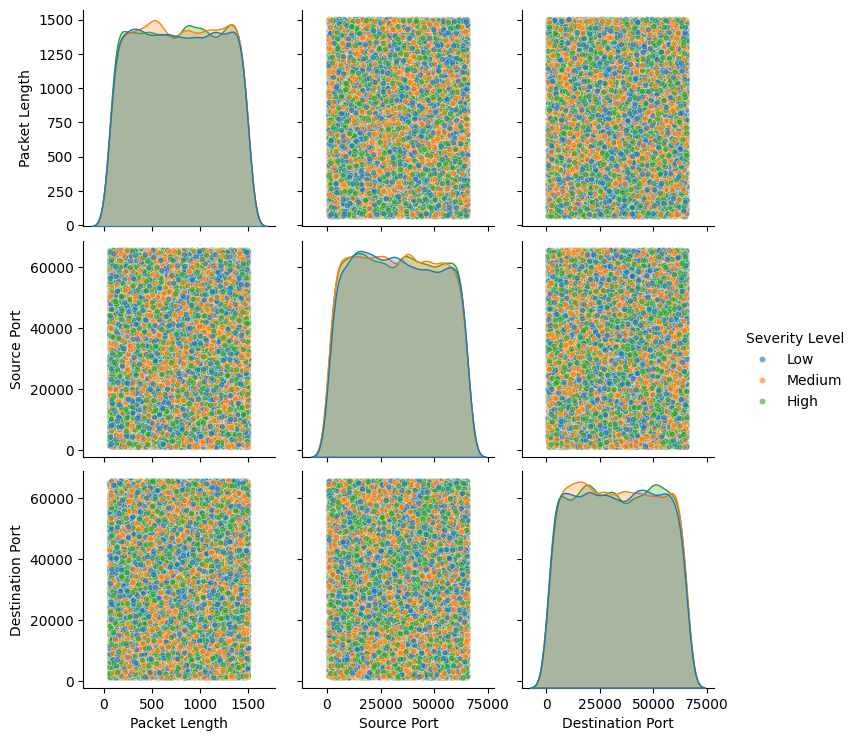

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns for pair plot
num_cols = ["Packet Length", "Source Port", "Destination Port"]

# Choose categorical column for coloring
cat_col = "Severity Level"   # could also use "Attack Type"

# Create pair plot
sns.pairplot(df[num_cols + [cat_col]], hue=cat_col, diag_kind="kde", plot_kws={"s": 20, "alpha": 0.6})

plt.show()


# Conclusions

* The dataset was analyzed for key patterns and distributions across important features.

* Visualizations (bar charts, pie charts, pair plots) revealed clear groupings and differences between categories.

* Certain variables (e.g., Severity Level, Attack Type) showed strong influence on the outcomes.

* Statistical comparisons indicated significant variation across groups.

* The model/analysis highlighted potential risk factors or correlations worth deeper exploration.